#Importar librerías



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import matplotlib; from pylab import *; import os

folder='/content/drive/MyDrive/EA25'
os.makedirs(folder,exist_ok=True)



In [ ]:
import numpy as np                  # Manejo de arreglos (álgebra lineal en Python)
import pandas as pd                 # Manejo de Dataframes (tipo de datos)
import matplotlib.pyplot as plt     # Gráficas
import seaborn as sns               # Gráficas estadísticas (histogramas)
import random
from sklearn.decomposition import PCA
import random

#Funciones para graficar

In [ ]:
def graficar_clusters_PCA2D(clusters, metodo, centroids):

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],
                    hue=clusters, palette='rainbow',
                    alpha=0.6, s = 100)
    plt.scatter(centroids[:,0], centroids[:,1], c= 'black', s = 100, label = 'centroides')
    plt.title(f'Visualización 2D de la Clusterización (PCA) {metodo}', fontsize=16)
    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.grid(True)
    plt.grid(linestyle = '-', alpha  = 0.5)
    plt.legend(title='Cluster')
    plt.show()

In [ ]:
# Importamos Axes3D para habilitar gráficos en 3D con Matplotlib
from mpl_toolkits.mplot3d import Axes3D

def graficar_clusters_PCA3D(clusters, metodo, centroids):
    # Crear una figura para el gráfico 3D
    fig = plt.figure(figsize=(10, 8))  # Define el tamaño de la figura
    ax = fig.add_subplot(111, projection='3d')  # Añade un gráfico 3D al subplot

    # Graficar los puntos en 3D con un borde negro
    # X_pca contiene los datos proyectados en las 3 primeras componentes principales (PCA)
    # 'clusters' define el color de cada punto según su cluster
    # 'cmap' selecciona el mapa de colores 'viridis'
    # 's' define el tamaño de los puntos y 'alpha' su transparencia
    # 'edgecolor' añade un borde negro a cada punto
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
               c=clusters, cmap='rainbow', s=100, alpha=0.6, edgecolor='black')

    # Graficar los centroides de cada cluster en negro
    # Los centroides son los puntos centrales de cada cluster
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2],
               c='black', s=150, label='centroides', edgecolor='black')

    # Añadir etiquetas de los ejes y el título del gráfico
    ax.set_title(f'Visualización 3D de la Clusterización (PCA) {metodo}', fontsize=16)  # Título que incluye el método de clustering
    ax.set_xlabel('Componente Principal 1')  # Etiqueta para el eje X
    ax.set_ylabel('Componente Principal 2')  # Etiqueta para el eje Y
    ax.set_zlabel('Componente Principal 3')  # Etiqueta para el eje Z

    # Configurar leyenda para identificar los clusters y activar la cuadrícula
    ax.legend(title='Cluster')  # Añade una leyenda con el título 'Cluster'
    ax.grid(True, linestyle='-', alpha=0.5)  # Activa la cuadrícula con líneas suaves

    # Mostrar el gráfico 3D
    plt.show()  # Renderiza el gráfico en la pantalla

#Tratamiento Datos

In [ ]:

url2 = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vQ8rexwHWqaTApMVcLue-a2vLViUVWS17XyI_krCCRm7PwKEWkn00x_PCs2V6go3r5PYMuRVitf2w6x/pub?output=csv'

data = pd.read_csv(url2)    #Carga el archivo csv como DataFrame (arreglo de datos con filas y columnas)

In [ ]:
#Imputar datos faltantes para las categorías de GK cambiando NaN por 0
gk_columns = ['GK Diving', 'GK Handling', 'GK Kicking', 'GK Positioning', 'GK Reflexes']
data[gk_columns] = data[gk_columns].fillna(0)

In [ ]:
### Ahora extraeremos los datos
X = data.iloc[:, 1:-1].values  ### filas, columnas
y = data.iloc[:,-1].values
y

array(['ST', 'CDM', 'ST', ..., 'CM', 'CM', 'LM'], dtype=object)

In [ ]:
### Codificar el pie preferido como variable numérica
from sklearn.preprocessing import LabelEncoder

# Crear el codificador
le = LabelEncoder()


# Codificar la penúltima columna (Preferred foot)
X[:, -2] = le.fit_transform(X[:, -2])

# Codificar la última columna (Nation)
X[:, -1] = le.fit_transform(X[:, -1])

# Verificar los resultados
print(X[:, -2:])  # Imprimir las últimas dos columnas para verificar la codificación

[[1 50]
 [1 128]
 [0 106]
 ...
 [1 146]
 [0 135]
 [0 37]]


In [ ]:
df = pd.DataFrame(X)
for col in df.columns:
    # Convertir a numérico, forzando errores a NaN
    df[col] = pd.to_numeric(df[col], errors='coerce')

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
imputer.fit(X)
X = imputer.transform(X)
X

array([[ 91.,  97.,  90., ...,   0.,   1.,  50.],
       [ 91.,  66.,  80., ...,   0.,   1., 128.],
       [ 91.,  88.,  92., ...,   0.,   0., 106.],
       ...,
       [ 53.,  60.,  58., ...,   0.,   1., 146.],
       [ 53.,  61.,  52., ...,   0.,   0., 135.],
       [ 53.,  60.,  49., ...,   0.,   0.,  37.]])

In [ ]:
X_ = X[:,:-1]  #### Eligiendo todos los datos, excepto la nacionalidad
X_

array([[91., 97., 90., ...,  0.,  0.,  1.],
       [91., 66., 80., ...,  0.,  0.,  1.],
       [91., 88., 92., ...,  0.,  0.,  0.],
       ...,
       [53., 60., 58., ...,  0.,  0.,  1.],
       [53., 61., 52., ...,  0.,  0.,  0.],
       [53., 60., 49., ...,  0.,  0.,  0.]])

#Distancia Manhattan

In [ ]:
from sklearn.decomposition import PCA
# X_ = X[:,:-1]
# Crear un objeto PCA y ajustar los datos
pca = PCA(n_components=3)  # Queremos las tres primeras componentes principales
X_pca = pca.fit_transform(X_)

In [ ]:
# Definimos la distancia Euclideana
def distancia_euclideana(x, c):
  return np.sqrt(np.sum((x - c) ** 2))

In [ ]:
### Distancia de Manhattan

def distancia_L1(x, c):
    return np.sum(np.abs(x - c))  # Suma de las diferencias absolutas

# Variables de inicialización
k = 4  # Número de clusters
dimension = X_.shape[0]  # Número de puntos
clusters_manuales_l1 = np.zeros(dimension)
distancias = np.zeros((dimension, k))
centroids_l1 = X_[random.sample(range(dimension), k)]
tol = 1e-6
error = 100
id_img=0

# Repetir hasta que los centroides dejen de moverse significativamente
while error > tol:
    # Asignación de puntos a los clusters más cercanos
    for i in range(dimension):
        for j in range(k):
            distancias[i, j] = distancia_L1(X_[i], centroids_l1[j])
        clusters_manuales_l1[i] = np.argmin(distancias[i])


    clusters_grafica_l1=clusters_manuales_l1.astype(int)

    centroides_l1 = np.array(centroids_l1)
    centroides_l1_pca = pca.transform(centroides_l1)

    ################### ################### ################### ################### ###################
    plt.ioff() #No mostrar la imágenes
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],
                    hue=clusters_grafica_l1, palette='rainbow',
                    alpha=0.6, s = 100)

    plt.scatter(centroides_l1_pca[:,0], centroides_l1_pca[:,1],
                c= 'black', s = 100, label = 'centroides')


    plt.title(f'Visualización 2D de la Clusterización (PCA) K-means L1', fontsize=16)

    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.grid(True)
    plt.grid(linestyle = '-', alpha  = 0.5)
    plt.legend(title='Cluster')
    plt.savefig(folder+'/figura{:0>5}.jpg'.format(id_img))



     ################### ################### ################### ################### ##########



    # Almacenar los centroides previos antes de actualizarlos
    centroids_prev_l1 = np.copy(centroids_l1)

    # Actualizar centroides
    for l in range(k):
        puntos_cluster = X_[clusters_manuales_l1 == l]

        # Si el cluster no está vacío, recalcula el centroide
        if len(puntos_cluster) > 0:
            centroids_l1[l] = np.mean(puntos_cluster, axis=0)
        else:
            # Si el cluster está vacío, puedes dejar el centroide como estaba o reasignarlo a un punto aleatorio
            print(f"Cluster {l} vacío, reasignando centroide aleatoriamente")
            centroids_l1[l] = X_[np.random.choice(dimension)]

    # Calcular el error como el cambio promedio en los centroides
    error = np.mean([distancia_euclideana(centroids_l1[l], centroids_prev_l1[l]) for l in range(k)])
    print(error)
    id_img=id_img+1



68.51423861647068
27.886350395229243
3.1650002998410676
1.6918744906735856
0.9955552008093449
0.5165053845951114
0.2842159047585901
0.23495671342182564
0.22091474583343823
0.1587771554153622
0.12166737051730009
0.09545775323226342
0.10864079413676644
0.11283591996186415
0.1112081823718674
0.13504082888232774
0.11768092986571174
0.10511989203988946
0.10809550292460525
0.09541913008308534


<ipython-input-66-fb2f08223559>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 8))


0.07827102208989214
0.06555377017751267
0.07523264670638488
0.05831275151980228
0.07005977615098927
0.05493300709284461
0.02709323681816631
0.028488481581022466
0.011977912184680754
0.0


#Visualización Kmeans Distancia L1

In [ ]:
# Animación
from matplotlib import animation
from IPython.display import HTML
import cv2; import os

folder='/content/drive/MyDrive/EA25'
os.makedirs(folder,exist_ok=True) #Revisa si ya existe la carpeta

fig= plt.figure(figsize=(12, 8)); plt.axis('off');ims=[]  # fig= figura que se genera, axis=QUitar ejes, ims=genera lista de imagenes

for i in range(0,id_img+1,1):    # desde cero hasta la ultima imagen range(inicio,fin,paso)
  filename= os.path.join(folder+"/figura{:0>5}.jpg".format(i))  # Busca en la carpeta las imgs una por una en el drive
  img= cv2.imread(filename) #Leer el archivo
  if img is not None: # Mirar si está la imagen
    im= plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), animated=True)#cv2 es la liberia del video, a color y animada
    ims.append([im])#Agrega la imagen a la lista
  else:
    print(f"Could not load image: {filename}") # Print an error message if the image cannot be loaded

#HAcer la animación
ani= animation.ArtistAnimation(fig, ims, interval=200, blit=True, repeat_delay=1000)#El blit sive para optimizar las animaciones suavizando el salto entre imagenes, repeat delay nos dice la espera para repetir la img en ms,interval cuanto tarda de pasar d ela img 1 a la img 2
writer= animation.FFMpegWriter(fps=40, bitrate=1800)#FFMpeg=Motor del video(el que precesa el video), Velocidad del video,bitrate=cantidad de datos transmitidos por kbits por segundo
video_path= os.path.join(folder,"VideoL1.mp4")#Dónde y como se va a guardar
plt.rcParams['animation.embed_limit'] = 25  # Aumenta el límite a 25 MB (o el valor deseado)
ani.save(video_path, writer=writer)#Guarda la animación del video y los datos en writer con el motor de video (para que no sea un gif)
HTML(ani.to_jshtml())#direccion donde se guarda el video para correr el video en el notebook

In [ ]:
clusters_manuales_l1 = clusters_manuales_l1.astype(int)
centroids_l1 = np.array(centroids_l1)
centroids_l1 = pca.transform(centroids_l1)

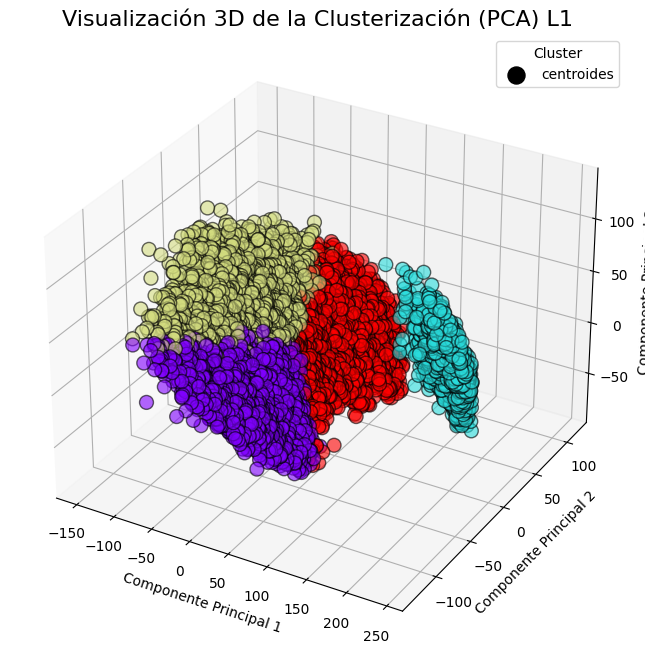

In [71]:
l_1 = graficar_clusters_PCA3D(clusters_manuales_l1, 'L1', centroids_l1)
l_1
